# Smoking Detection Using CNN (fastai)

fast.ai is a non-profit research group focused on deep learning and artificial intelligence founded in 2016 by Jeremy Howard and Rachel Thomas with the goal of democratising deep learning.In the fall of 2018, fast.ai released v1.0 of their free open source library for deep learning called fastai (without a period), sitting atop PyTorch. Google Cloud was the first to announce its support. This open-source framework is hosted on GitHub and is licensed under the Apache License, Version 2.0.

### First, we install fastai in our system.

In [33]:
pip install fastai

Note: you may need to restart the kernel to use updated packages.


### Importing all the modules from fastai vision

In [34]:
from fastai.vision.all import *

### Setting the path of the training data in "Folder" variable

In [44]:
Folder=Path(r'C:\Users\abhi1\OneDrive\Desktop\smokingVSnotsmoking\dataset\training_data')

### Creating a function to label the images "Yes" or "No" depending on if the person in the image is smoking or not.

DataBlock is basically a blueprint on how we want to assemble our data. 
ImageBlock and CategoryBlock are used to specify that our inputs are images and our targets are categories.
We use get_items funstion to actually assemble the items or images inside the DataBlock. 
get_y is the function that we use to tell the DataBlock to label the items or images. In this case, label the images as "Yes" or "No".
Resize puts the images in a particular size frame.
DataLoader is used to load the dataset that is to be used. "Folder" is the path where the dataset is stored.
After loading the dataset, we display 8 images(in 4 rows), each from training batch and validation batch.

Due to IPython and Windows limitation, python multiprocessing isn't available now.
So `number_workers` is changed to 0 to avoid getting stuck


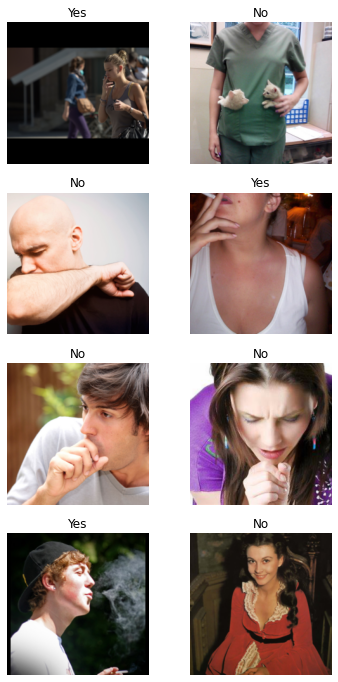

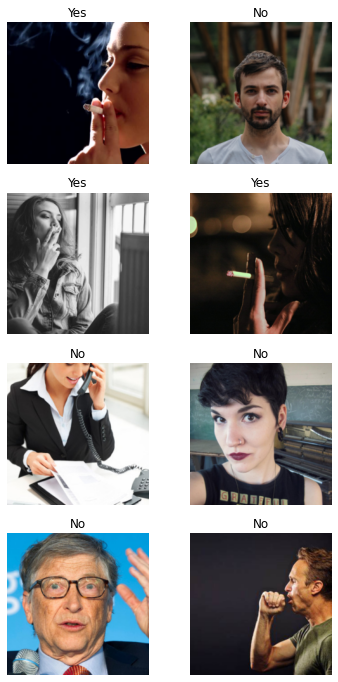

In [70]:
def smoking_(x):
  return 'Yes' if parent_label(x)=='smoking' else 'No'
  
image_set = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files,         
    get_y=smoking_,                                        
    item_tfms=Resize(224))

dls = image_set.dataloaders(Folder)                         

dls.train.show_batch(max_n=8, nrows=4)  
dls.valid.show_batch(max_n=8, nrows=4)

### Training the model

Convoluted neural network (CNN) is the de facto type of neural network used for image classification. In terms of the architecture, resnet34 (i.e. 34 layers deep) is used for the cnn_learner fast.ai function.
".fine_tune" method instead of ".fit" because we are leveraging on the pretrained resnet model to perform transfer learning. We specify the number of epochs to be 4. The number of epochs mean, the number of times each image is sent in the training model.
It does not mean that more number of epochs will increase the accuracy of the model. Larger number of epochs can lead to overfitting, where the accuracy on training data will increase to a great value, but the accuracy on testing data or unseen images will be low.

In [72]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.863725,0.398074,0.161491,10:51


epoch,train_loss,valid_loss,error_rate,time
0,0.431590,0.329167,0.149068,10:21
1,0.293767,0.348429,0.114907,10:19
2,0.207131,0.304422,0.108696,10:40
3,0.151690,0.257248,0.093168,17:53


Train Loss is the value of the objective function that you are minimizing. This value could be a positive or negative number, depending on the specific objective function of your training data. The training loss is calculated over the entire training dataset.
Validation loss is the loss calculated on the validation set, when the data is split to train / validation / test sets using cross-validation.
The error basically signifies how well your network is performing on a certain (training/testing/validation) set.

### Confusion Matrix

A confusion matrix is a table that is often used to describe the performance of a classification model on a set of test data for which the true values are known. 
true positives (TP): These are cases in which we predicted yes (they have the disease), and they do have the disease.
true negatives (TN): We predicted no, and they don't have the disease.
false positives (FP): We predicted yes, but they don't actually have the disease. (Also known as a "Type I error.")
false negatives (FN): We predicted no, but they actually do have the disease. (Also known as a "Type II error.")


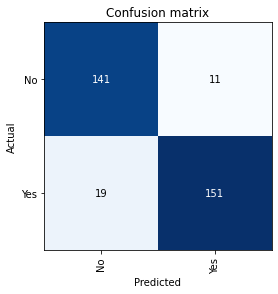

In [73]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Accuracy percentage can also be calculated using confusion matrix.
Accuracy = [(TP+FN)/(TP+TN+FP+FN)]*100
i.e., [(141+151)/(141+11+19+151)]*100

6 epochs 89.1566% accuracy
4 epochs 90.6832% accuracy

### Displaying the images and predicting for unseen images

In [85]:
from IPython.display import Image

This is an image that is available in the testing dataset, which is without lable.

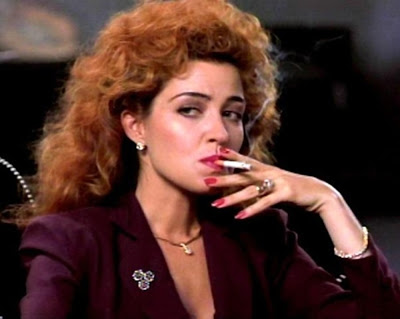

In [114]:
filename=r'C:\Users\abhi1\OneDrive\Desktop\smokingVSnotsmoking\dataset\testing_data\abc162.jpg'
Image(filename,width=300,height=300)

In [115]:
test=Path(filename)

In [116]:
learn.predict(test)

('Yes', TensorBase(1), TensorBase([1.0636e-05, 9.9999e-01]))

After getting correct output, we move ahead and test it with the images in camera roll.

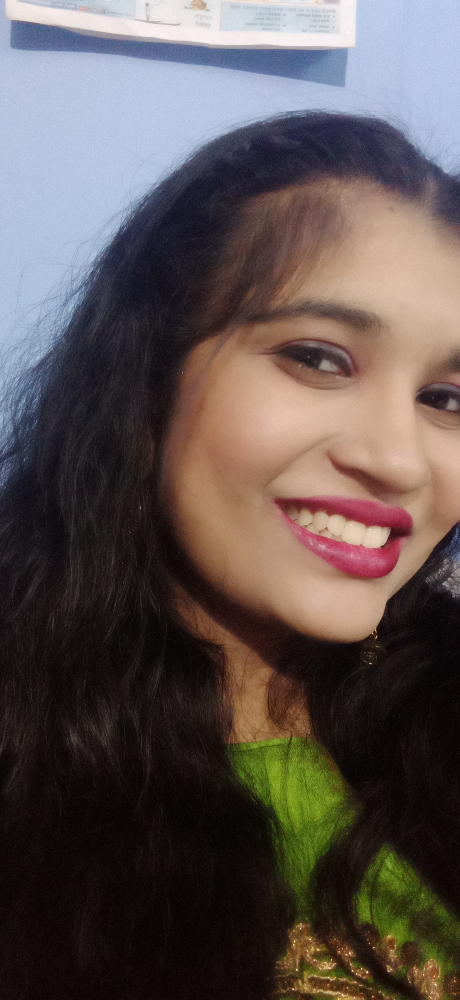

In [108]:
unseen=r"D:\Poco M2\Pics\Camera\test2.jpg"
Image(unseen,width=300,height=100)

In [107]:
learn.predict(unseen)

('No', TensorBase(0), TensorBase([0.9426, 0.0574]))

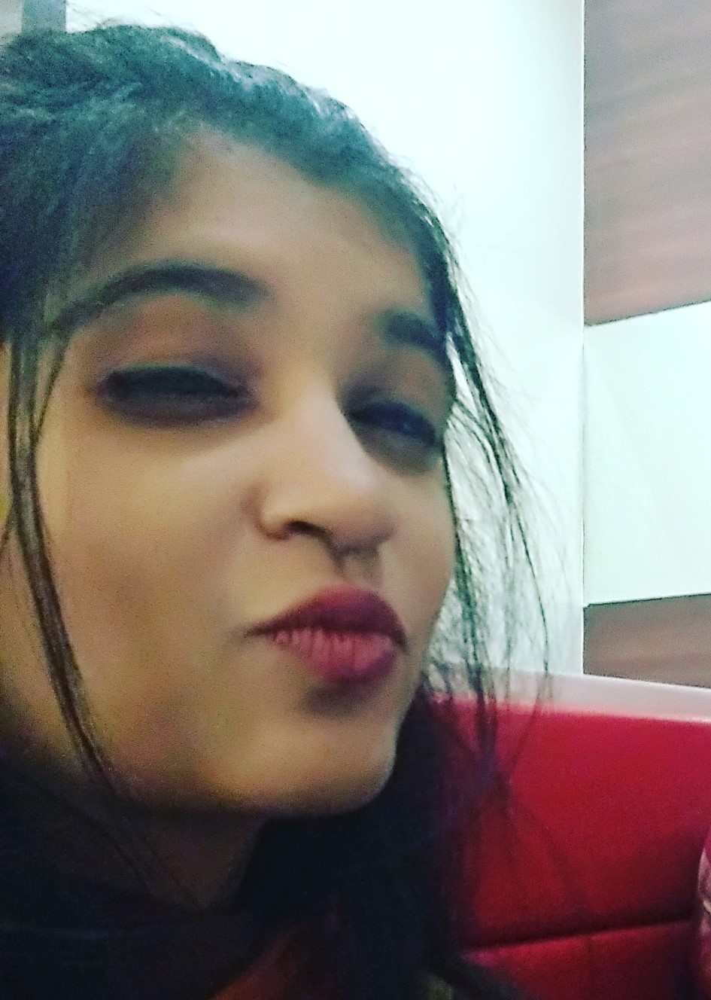

In [110]:
unseen2=r"D:\Poco M2\Pics\Camera\test3.jpg"
Image(unseen2,width=300,height=100)

In [111]:
learn.predict(unseen2)

('No', TensorBase(0), TensorBase([0.9862, 0.0138]))

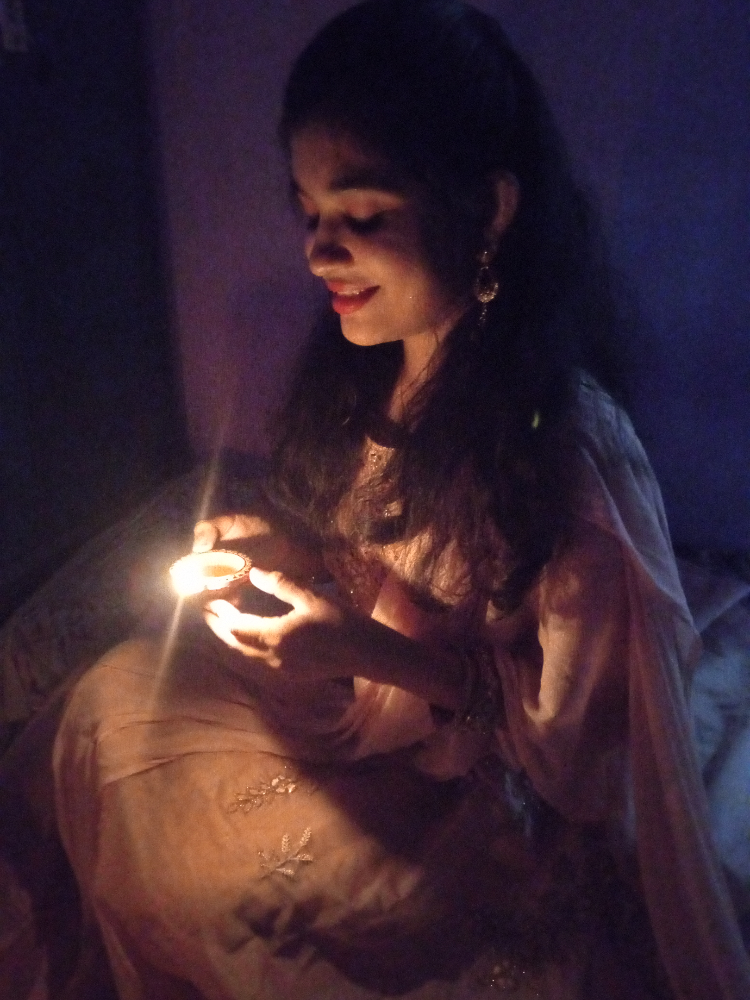

In [112]:
unseen3=r"D:\Poco M2\Pics\Camera\test.jpg"
Image(unseen3,width=300,height=100)

In [113]:
learn.predict(unseen3)

('Yes', TensorBase(1), TensorBase([1.1312e-06, 1.0000e+00]))

Since our model detects "fire" and "smoke" in the image it has been labelled as "Yes"